# Rental Property Analysis and Feature Extraction Pipeline

This notebook performs a comprehensive analysis of rental properties in Victoria, Australia. The data is cleaned and processed to include a wide range of features, such as distances from the CBD, proximity to transport stations, property size, and additional amenities. The analysis further includes price outlier detection, feature extraction from property descriptions and headlines, and a prediction pipeline for key rental price determinants.

## Table of Contents
1. Loading Necessary Libraries
2. Reading Cleaned Data
3. Data Analysis
   - Distances and Duration from CBD
   - Property Type and Internal Features
   - Public Transport Analysis
   - Additional Features and Amenities
4. NLP Analysis of Property Descriptions
5. Sentiment Analysis and Topic Modeling
6. BERT-Based Classification of Property Descriptions
7. Geospatial Analysis and Exporting Data for Further Use


In [1]:
!pip install gensim textblob

  Obtaining dependency information for gensim from https://files.pythonhosted.org/packages/2a/15/aca2fc3b9e97bd0e28be4a4302793c43757b04b828223c6d103c72132f19/gensim-4.3.3-cp311-cp311-macosx_11_0_arm64.whl.metadata
  Using cached gensim-4.3.3-cp311-cp311-macosx_11_0_arm64.whl.metadata (8.1 kB)
  Obtaining dependency information for textblob from https://files.pythonhosted.org/packages/02/07/5fd2945356dd839974d3a25de8a142dc37293c21315729a41e775b5f3569/textblob-0.18.0.post0-py3-none-any.whl.metadata
  Using cached textblob-0.18.0.post0-py3-none-any.whl.metadata (4.5 kB)
  Obtaining dependency information for nltk>=3.8 from https://files.pythonhosted.org/packages/4d/66/7d9e26593edda06e8cb531874633f7c2372279c3b0f46235539fe546df8b/nltk-3.9.1-py3-none-any.whl.metadata
  Using cached nltk-3.9.1-py3-none-any.whl.metadata (2.9 kB)
Using cached gensim-4.3.3-cp311-cp311-macosx_11_0_arm64.whl (24.0 MB)
Using cached textblob-0.18.0.post0-py3-none-any.whl (626 kB)
Using cached nltk-3.9.1-py3-none-any

In [21]:
import pandas as pd
from datetime import datetime

import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nbformat
import geopandas as gpd
from shapely.geometry import Point

import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as stats
from scipy.stats import pearsonr

import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
import torch
from transformers import AutoTokenizer, BertForSequenceClassification
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from textblob import TextBlob

color_palette = px.colors.qualitative.Plotly

### **Reading In Cleaned Data**

In [3]:
data_cleaned = pd.read_csv("../data/raw/cleaned.csv")
data_cleaned

,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Property_Headline,...,Street_Name,Property_Size,geometry,Distances to CBD,Durations to CBD,SA2_CODE21,SA2_NAME21,AREASQKM21,LOCI_URI21,suburb_geometry
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,Well-presented home with all the bells and whi...,...,Isabella Way,449.800000,POINT (144.6532452 -37.8379288),31.04749,40.374833,213051583,Tarneit - Central,7.9607,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.6523178479315 -37.83944528652476...
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,Modern Living & Convenience in the Heart of Ca...,...,Lygon Street,98.498702,POINT (144.9690564 -37.7935594),3.23413,6.918167,206041117,Carlton,1.8187,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.9748830463324 -37.79793898811754...
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,Close to everything!,...,Modra Street,219.853182,POINT (144.7731119 -37.9057069),29.66289,37.574833,213051464,Point Cook - East,19.0354,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.7534775437447 -37.90070077370988...
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,Great Unit,...,Droop street,98.498702,POINT (144.8957304 -37.79607499999999),7.74954,15.563000,213031348,Footscray,4.9671,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.8831003432733 -37.78858527179909...
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,"Two bedroom apartment, unit, townhouse & wareh...",...,Buckley Street,98.498702,POINT (144.9090784 -37.7563413),9.51315,18.183500,206031502,Essendon - East,3.5543,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.9097019431684 -37.74685583335111...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12387,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0,0,0,House,-36.543437,145.984015,STORAGE SHEDS AVAILABLE - 21 HANNAH STREET,...,Hannah Street,219.853182,POINT (145.9840153 -36.5434371),202.65797,146.344333,204021063,Benalla,315.3043,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((145.9175239231474 -36.55746990654701...
12388,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4,2,2,House,-37.759074,144.696542,Home in the heart of Truganina.,...,Yosemite Street,219.853182,POINT (144.696542 -37.7590745),32.85126,33.444667,213041359,Rockbank - Mount Cottrell,125.7609,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.6179810465789 -37.72021265348595...
12389,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4,2,2,House,-37.676119,144.900169,FOUR BEDROOM HOME,...,Kenny Street,219.853182,POINT (144.9001691 -37.6761187),18.21199,29.988833,210051245,Gladstone Park - Westmeadows,13.9360,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((144.8715228168004 -37.68171008034838...
12390,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2,1,0,Apartment / Unit / Flat,-37.913004,145.124261,KUSP Apartments - Student Accommodation Clayton,...,Dandenong Road,98.498702,POINT (145.124261 -37.9130043),23.21435,27.690667,212051567,Clayton (North) - Notting Hill,5.2293,http://linked.data.gov.au/dataset/asgsed3/SA2/...,POLYGON ((145.1232019286827 -37.90657123898076...


In [4]:
data_cleaned.columns

Index(['URL', 'Rent_Price', 'Address', 'Bedrooms', 'Bathrooms', 'Parking',
       'Property_Type', 'Latitude', 'Longitude', 'Property_Headline',
       'Property_Description', 'Extra_Features', 'Date_Available', 'Bond',
       'Internal_Area', 'Land_Area', 'Street', 'Suburb', 'Postcode',
       'Availability', 'Street_Name', 'Property_Size', 'geometry',
       'Distances to CBD', 'Durations to CBD', 'SA2_CODE21', 'SA2_NAME21',
       'AREASQKM21', 'LOCI_URI21', 'suburb_geometry'],
      dtype='object')

In [5]:
len(data_cleaned["SA2_CODE21"].unique())

411

# **Exploratory Data Analysis (EDA)**

In this section, we dive into the dataset to explore key relationships between features and rental prices. We analyze spatial distributions, relationships with property types, amenities, proximity to transport, and other factors that can impact rental pricing.


## **Distances to CBD**

This section explores the relationship between the distance of properties from the Central Business District (CBD) and their rental prices. The analysis includes visualizations, statistical correlation calculations, and summary insights to understand how proximity to the CBD affects rental values.


In [6]:
# Create bins for distance ranges from the CBD
bins = [0, 5, 10, 15, 20, 30, 50, 100] 
bin_labels = ['0-5 km', '5-10 km', '10-15 km', '15-20 km', '20-30 km', '30-50 km', '50+ km']

# Assign each property to a distance bin based on its distance to the CBD
data_cleaned['Distance_Bin'] = pd.cut(data_cleaned['Distances to CBD'], bins=bins, labels=bin_labels, include_lowest=True)

# Calculate the average rent price for each distance bin
avg_rent_by_distance = data_cleaned.groupby('Distance_Bin')['Rent_Price'].mean().reset_index()


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/2056347571.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_rent_by_distance = data_cleaned.groupby('Distance_Bin')['Rent_Price'].mean().reset_index()


In [7]:
# Create a bar plot showing the average rent price for each distance bin from the CBD
fig = px.bar(avg_rent_by_distance, 
             x="Distance_Bin", 
             y="Rent_Price", 
             title="Average Rent Price by Distance from CBD",
             labels={'Distance_Bin': 'Distance from CBD', 'Rent_Price': 'Average Rent Price'},
             color="Distance_Bin")

# Add a trend line to show the pattern across distance bins
fig.add_trace(
    go.Scatter(
        x=avg_rent_by_distance['Distance_Bin'],
        y=avg_rent_by_distance['Rent_Price'],
        mode='lines+markers',
        name='Trend Line',
        line=dict(color='black', width=2),
        marker=dict(size=8)
    )
)

fig.show()


/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(required_grouper, sort=False)  # skip one_group groupers
/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


In [8]:
# Calculate the Pearson correlation coefficient between distance from CBD and rental price
dist_correlation, dist_p_value = pearsonr(data_cleaned['Distances to CBD'], data_cleaned['Rent_Price'])

# Print the correlation value and the p-value for statistical significance
print(f"Correlation between distance and rental price: {dist_correlation:.4f}")
print(f"P-value for the correlation: {dist_p_value}")


Correlation between distance and rental price: -0.2324
P-value for the correlation: 1.1950694857319414e-151


#### **Conclusion for Distance and Rent**
**The correlation between distance from the CBD and rental price is -0.2324, showing a weak negative relationship. The extremely low p-value (1.20e-151) indicates this relationship is statistically significant.**


## **Duration to CBD**
The following analysis explores the relationship between the duration from the Central Business District (CBD) to the rental property and the corresponding rental price.

In [11]:
print("Min duration", min(data_cleaned['Durations to CBD']), "Max duration", max(data_cleaned['Durations to CBD']))
px.scatter(data_cleaned, x="Durations to CBD", y="Rent_Price")

Min duration 0.0031666666666666 Max duration 383.9088333333333


The duration from the CBD to rental properties ranges from a minimum of a few minutes to a maximum of several hours. To better understand how this affects rent prices, the dataset was divided into bins based on different ranges of duration.

In [12]:
# Creating bins of 20-minute intervals for duration to CBD
min_duration = data_cleaned['Durations to CBD'].min()
max_duration = data_cleaned['Durations to CBD'].max()
bin_size = 20
bins = list(range(int(min_duration), int(max_duration) + bin_size, bin_size))
bin_labels = [f'{i}-{i + bin_size} min' for i in bins[:-1]]  

# Assigning duration bins to each property
data_cleaned['Duration_Bin'] = pd.cut(data_cleaned['Durations to CBD'], bins=bins, labels=bin_labels, include_lowest=True)
# Calculating average rent price for each duration bin
avg_rent_by_duration = data_cleaned.groupby('Duration_Bin')['Rent_Price'].mean().reset_index()

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/3669681484.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [13]:
# Creating a bar chart to visualize average rent price by duration bins
fig = px.bar(avg_rent_by_duration, x="Duration_Bin", y="Rent_Price", title="Average Rent Price by Duration from CBD",
             labels={'Duration_Bin': 'Duration from CBD', 'Rent_Price': 'Average Rent Price'},
             color="Duration_Bin")

# Adding a trend line to the bar chart
fig.add_trace(
    go.Scatter(
        x=avg_rent_by_duration['Duration_Bin'],
        y=avg_rent_by_duration['Rent_Price'],
        mode='lines+markers',
        name='Trend Line',
        line=dict(color='black', width=2),
        marker=dict(size=8)
    )
)

fig.show()

/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [14]:
# Calculating correlation between duration to CBD and rent price
dur_correlation, dur_p_value = pearsonr(data_cleaned['Durations to CBD'], data_cleaned['Rent_Price'])

print(f"Correlation between distance and rental price: {dur_correlation:.4f}")
print(f"P-value for the correlation: {dur_p_value}")

Correlation between distance and rental price: -0.2378
P-value for the correlation: 7.236978212406929e-159


#### **Conclusion for Duration and Rent**
The correlation between duration from the CBD and rental price is -0.2378, showing a weak negative relationship. The extremely low p-value (7.23e-159) indicates that this relationship is statistically significant.

## **Property Type & Internal Features**

The following analysis explores the relationship between different property types and their corresponding rental prices.

In [16]:
# Calculating average rent price by property type
property_rent = data_cleaned.groupby("Property_Type")['Rent_Price'].mean().reset_index()

# Creating a bar chart to visualize average rent price by property type
fig = px.bar(property_rent, 
             x="Property_Type", 
             y="Rent_Price", 
             title="Average Rent Price by Property Type",
             labels={'Rent_Price':'Average Rent Price', 'Property_Type':'Property Type'})

fig.update_layout(xaxis_tickangle=-45, 
                  yaxis_title="Average Rent Price (AUD)",
                  xaxis_title="Property Type",
                  title_x=0.5)  
fig.show()

In [17]:
# Performing ANOVA to test if there are significant differences between property types
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Property_Type')])
print(anova_result)
if anova_result.pvalue < 0.05:
    print("The differences between property types are statistically significant.")
else:
    print("No significant differences were found between property types.")

F_onewayResult(statistic=113.66254740558854, pvalue=2.2627912014222605e-227)
The differences between property types are statistically significant.


#### **Conclusion for Property Type and Rent**

**The ANOVA results (F-statistic: 113.66, p-value: 2.26e-227) indicate that there are statistically significant differences between property types, suggesting that the type of property significantly influences the rental price.**

## **Bedroom & Bathroom Number**
Examining the relationship between the number of bedrooms, bathrooms, and rental price using correlation, visualizations, and ANOVA.

### **Distribution of Data Points for Bedroom Feature**

In [18]:
fig = px.histogram(data_cleaned, 
             x="Bedrooms", 
             title="Histogram of Number of Bedrooms")
fig.show()

In [19]:
# Filter the dataset to remove properties with 6 or more bedrooms to exclude potential outliers.
data_cleaned = data_cleaned.loc[data_cleaned["Bedrooms"] < 6]
# Group the dataset by the number of bedrooms and calculate the average rent price for each group.
bedroom_rent = data_cleaned.groupby("Bedrooms")['Rent_Price'].mean().reset_index()
fig = go.Figure()

# Add a bar trace to visualize the average rent price for each bedroom category.
fig.add_trace(go.Bar(
    x=bedroom_rent['Bedrooms'],
    y=bedroom_rent['Rent_Price'],
    name='Average Rent Price',
    marker_color='lightskyblue'
))

fig.add_trace(go.Scatter(
    x=bedroom_rent['Bedrooms'],
    y=bedroom_rent['Rent_Price'],
    mode='lines+markers',
    name='Trend Line',
    line=dict(color='royalblue', width=3),
    marker=dict(size=8)
))

fig.update_layout(
    title="Average Rent Price by Number of Bedrooms (After Removing Outliers)",
    xaxis_title="Number of Bedrooms",
    yaxis_title="Average Rent Price",
    title_x=0.5,
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1
    ),
    yaxis=dict(
        gridcolor='lightgray'
    ),
    legend=dict(
        x=0.8,
        y=1.1
    )
)

fig.show()

In [20]:
# Calculate the Pearson correlation to assess the linear relationship between Bedrooms and Rent Price
pearson_corr, p_value_pearson = stats.pearsonr(data_cleaned['Bedrooms'].astype(float), data_cleaned['Rent_Price'])
# Calculate the Spearman correlation to assess the monotonic relationship between Bedrooms and Rent Price
spearman_corr, p_value_spearman = stats.spearmanr(data_cleaned['Bedrooms'].astype(float), data_cleaned['Rent_Price'])
# Fit an OLS regression model with Rent_Price as the dependent variable and Bedrooms as a categorical independent variable
model = ols('Rent_Price ~ C(Bedrooms)', data=data_cleaned).fit()
# Perform ANOVA to assess if the number of Bedrooms significantly affects Rent Price
anova_table = sm.stats.anova_lm(model, typ=2)

print(f"Pearson Correlation: {pearson_corr:.3f}, p-value: {p_value_pearson:.3e}")
if p_value_pearson < 0.05:
    print("There is a statistically significant linear relationship between Bedrooms and Rent Price.")
else:
    print("There is no statistically significant linear relationship between Bedrooms and Rent Price.")

print(f"Spearman Correlation: {spearman_corr:.3f}, p-value: {p_value_spearman:.3e}")
if p_value_spearman < 0.05:
    print("There is a statistically significant monotonic relationship between Bedrooms and Rent Price.")
else:
    print("There is no statistically significant monotonic relationship between Bedrooms and Rent Price.")

print("\nANOVA Table:")
print(anova_table)
if anova_table['PR(>F)'][0] < 0.05:
    print("\nThe number of bedrooms significantly affects the rent price.")
else:
    print("\nThe number of bedrooms does not significantly affect the rent price.")


Pearson Correlation: 0.336, p-value: 9.881e-324
There is a statistically significant linear relationship between Bedrooms and Rent Price.
Spearman Correlation: 0.320, p-value: 3.596e-293
There is a statistically significant monotonic relationship between Bedrooms and Rent Price.

ANOVA Table:
                   sum_sq       df           F  PR(>F)
C(Bedrooms)  4.701608e+07      5.0  536.128126     0.0
Residual     2.166958e+08  12355.0         NaN     NaN

The number of bedrooms significantly affects the rent price.


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/1913728337.py:24: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



#### **Number of Bedrooms and Rent Price**
- There is a moderate positive linear and monotonic relationship between the number of bedrooms and rent price, as shown by both Pearson and Spearman correlations.
- Both relationships are statistically significant, meaning the number of bedrooms has a meaningful impact on rent prices.
- The ANOVA test further confirms that the number of bedrooms significantly affects rent price, showing strong categorical effects.


### **Distribution of Data Points for Bathroom Feature**

In [24]:
fig = px.histogram(data_cleaned, 
             x="Bathrooms", 
             title="Histogram of Number of Bathrooms")
fig.show()

In [25]:
data_cleaned = data_cleaned.loc[data_cleaned["Bathrooms"] < 6]
bathroom_rent = data_cleaned.groupby("Bathrooms")['Rent_Price'].mean().reset_index()
fig = go.Figure()

# Add the bar trace for Average Rent Price by Number of Bathrooms
fig.add_trace(go.Bar(
    x=bathroom_rent['Bathrooms'],
    y=bathroom_rent['Rent_Price'],
    name='Average Rent Price',
    marker_color=color_palette[:len(bathroom_rent)], 
    text=bathroom_rent['Rent_Price'].round(2),  
    textposition='outside'
))

fig.add_trace(go.Scatter(
    x=bathroom_rent['Bathrooms'],
    y=bathroom_rent['Rent_Price'],
    mode='lines+markers',
    name='Trend Line',
    line=dict(color='black', width=3),
    marker=dict(size=10, color='black')  
))

fig.update_layout(
    title="Average Rent Price by Number of Bathrooms (After Removing Outliers)",
    xaxis_title="Number of Bathrooms",
    yaxis_title="Average Rent Price (AUD)",
    title_x=0.5,
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1,
        title_standoff=10
    ),
    yaxis=dict(
        gridcolor='lightgray'
    ),
    legend=dict(
        x=0.8,
        y=1.15,
        orientation='h'
    ),
    margin=dict(l=40, r=40, t=60, b=100)
)

fig.show()

In [26]:
# Calculate Pearson correlation to assess the linear relationship between Bathrooms and Rent Price
pearson_corr, p_value_pearson = stats.pearsonr(data_cleaned['Bathrooms'].astype(float), data_cleaned['Rent_Price'])
# Calculate Spearman correlation to assess the monotonic relationship between Bathrooms and Rent Price
spearman_corr, p_value_spearman = stats.spearmanr(data_cleaned['Bathrooms'].astype(float), data_cleaned['Rent_Price'])
# Fit an OLS regression model with Rent_Price as the dependent variable and Bathrooms as a categorical independent variable
model = ols('Rent_Price ~ C(Bathrooms)', data=data_cleaned).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

print(f"Pearson Correlation: {pearson_corr:.3f}, p-value: {p_value_pearson:.3e}")
if p_value_pearson < 0.05:
    print("There is a statistically significant linear relationship between Bathrooms and Rent Price.")
else:
    print("There is no statistically significant linear relationship between Bathrooms and Rent Price.")

print(f"Spearman Correlation: {spearman_corr:.3f}, p-value: {p_value_spearman:.3e}")
if p_value_spearman < 0.05:
    print("There is a statistically significant monotonic relationship between Bathrooms and Rent Price.")
else:
    print("There is no statistically significant monotonic relationship between Bathrooms and Rent Price.")

print("\nANOVA Table:")
print(anova_table)
if anova_table['PR(>F)'][0] < 0.05:
    print("\nThe number of Bathrooms significantly affects the rent price.")
else:
    print("\nThe number of Bathrooms does not significantly affect the rent price.")


Pearson Correlation: 0.422, p-value: 0.000e+00
There is a statistically significant linear relationship between Bathrooms and Rent Price.
Spearman Correlation: 0.415, p-value: 0.000e+00
There is a statistically significant monotonic relationship between Bathrooms and Rent Price.

ANOVA Table:
                    sum_sq       df          F  PR(>F)
C(Bathrooms)  4.709125e+07      5.0  537.47771     0.0
Residual      2.164447e+08  12352.0        NaN     NaN

The number of Bathrooms significantly affects the rent price.


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/1142309833.py:23: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



#### **Number of Bathrooms and Rent Price**
- Pearson Correlation of 0.422 indicates a moderate positive linear relationship between the number of bathrooms and rent price, and the p-value of 0.000 confirms this relationship is statistically significant.
- Spearman Correlation of 0.415 shows a moderate positive monotonic relationship between bathrooms and rent price, which is also statistically significant (p-value of 0.000).
- The ANOVA results indicate that the number of bathrooms has a significant categorical effect on rent price, with a p-value of 0.0 confirming this effect.


### **Number of Parkings**
Examining the relationship between the number of Parkings and rental price using correlation, visualizations, and ANOVA.
### **Distribution of Data Points for Parking Feature**

In [27]:
fig = px.histogram(data_cleaned, 
             x="Parking", 
             title="Histogram of Number of Parkings")
fig.show()

In [28]:
data_cleaned = data_cleaned.loc[data_cleaned["Parking"] < 6]
parking_rent = data_cleaned.groupby("Parking")['Rent_Price'].mean().reset_index()

In [29]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=parking_rent['Parking'],
    y=parking_rent['Rent_Price'],
    name='Average Rent Price',
    marker_color='lightskyblue'
))

fig.add_trace(go.Scatter(
    x=parking_rent['Parking'],
    y=parking_rent['Rent_Price'],
    mode='lines+markers',
    name='Trend Line',
    line=dict(color='royalblue', width=3),
    marker=dict(size=8)
))

fig.update_layout(
    title="Average Rent Price by Number of Parking (After Removing Outliers)",
    xaxis_title="Number of Parking",
    yaxis_title="Average Rent Price",
    title_x=0.5,
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1
    ),
    yaxis=dict(
        gridcolor='lightgray'
    ),
    legend=dict(
        x=0.8,
        y=1.1
    )
)

fig.show()

In [30]:
# Calculate Pearson correlation to assess the linear relationship between Parking and Rent Price
pearson_corr, p_value_pearson = stats.pearsonr(data_cleaned['Parking'].astype(float), data_cleaned['Rent_Price'])

# Calculate Spearman correlation to assess the monotonic relationship between Parking and Rent Price
spearman_corr, p_value_spearman = stats.spearmanr(data_cleaned['Parking'].astype(float), data_cleaned['Rent_Price'])

# Fit an OLS regression model with Rent_Price as the dependent variable and Parking as a categorical independent variable
model = ols('Rent_Price ~ C(Parking)', data=data_cleaned).fit()

# Perform ANOVA to check if the number of Parking spots significantly affects Rent Price
anova_table = sm.stats.anova_lm(model, typ=2)

# Output Pearson correlation and determine if the p-value shows a statistically significant linear relationship
print(f"Pearson Correlation: {pearson_corr:.3f}, p-value: {p_value_pearson:.3e}")
if p_value_pearson < 0.05:
    print("There is a statistically significant linear relationship between Parking and Rent Price.")
else:
    print("There is no statistically significant linear relationship between Parking and Rent Price.")

# Output Spearman correlation and determine if the p-value shows a statistically significant monotonic relationship
print(f"Spearman Correlation: {spearman_corr:.3f}, p-value: {p_value_spearman:.3e}")
if p_value_spearman < 0.05:
    print("There is a statistically significant monotonic relationship between Parking and Rent Price.")
else:
    print("There is no statistically significant monotonic relationship between Parking and Rent Price.")

# Output the ANOVA table to check for significant categorical effects of Parking on Rent Price
print("\nANOVA Table:")
print(anova_table)

# Determine if the ANOVA p-value shows that Parking significantly affects Rent Price
if anova_table['PR(>F)'][0] < 0.05:
    print("\nThe number of Parking significantly affects the rent price.")
else:
    print("\nThe number of Parking does not significantly affect the rent price.")


Pearson Correlation: 0.177, p-value: 1.325e-87
There is a statistically significant linear relationship between Parking and Rent Price.
Spearman Correlation: 0.184, p-value: 8.160e-94
There is a statistically significant monotonic relationship between Parking and Rent Price.

ANOVA Table:
                  sum_sq       df          F        PR(>F)
C(Parking)  9.523781e+06      5.0  93.133733  1.428008e-96
Residual    2.514758e+08  12296.0        NaN           NaN

The number of Parking significantly affects the rent price.


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/1895013680.py:32: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



#### **Conclusion for Number of Parking and Rental Price**
- Pearson Correlation of 0.177 shows a weak positive linear relationship between parking availability and rent price. The p-value of 1.325e-87 confirms that this relationship is statistically significant, meaning the number of parking spots is still relevant in determining rent prices, though the linear effect is small.

- Spearman Correlation of 0.184 also indicates a weak positive monotonic relationship, and the p-value of 8.160e-94 demonstrates that this relationship is statistically significant as well, but the effect is similarly weak.

- ANOVA Results indicate that the availability of parking has a significant categorical effect on rent prices. The F-statistic is high (93.13) and the p-value is extremely small (1.428e-96), confirming the significance.



## **Public transports**

Examining the relationship between the distance to Public Transport and rental price using correlation.

In [32]:
# Load the shapefile for SA2 regions in Australia
shapefile_path = '../data/landing/SA2_2021_AUST_SHP_GDA2020/SA2_2021_AUST_GDA2020.shp'
gdf = gpd.read_file(shapefile_path)

# Filter the shapefile to include only regions in Victoria
gdf['STE_NAME21'].unique()
gdf = gdf.loc[gdf['STE_NAME21'] == 'Victoria']

# Rename the geometry column for clarity and set it as the active geometry for geospatial operations
gdf = gdf.rename(columns={'geometry': 'suburb_geometry'})
gdf = gdf.set_geometry('suburb_geometry')

# Load the metro train stops data from a CSV file
metro_train = pd.read_csv("../data/landing/gtfs/2/stops.txt", sep=',')

# Convert the longitude and latitude columns into geometry points
metro_train['geometry'] = gpd.points_from_xy(metro_train['stop_lon'], metro_train['stop_lat'])

# Convert the train stops DataFrame into a GeoDataFrame with the appropriate coordinate reference system (CRS)
train_stations_gdf = gpd.GeoDataFrame(metro_train, geometry='geometry', crs="EPSG:4326")

# Reproject the SA2 regions GeoDataFrame to match the CRS of the train stations
gdf = gdf.to_crs(epsg=4326)

# Perform a spatial join to find which train stations are located within the SA2 regions
train_stations_merge = gpd.sjoin(train_stations_gdf, gdf, how='left', predicate='within')

# Merge the resulting GeoDataFrame back with the SA2 GeoDataFrame based on the SA2_CODE21 field
merged_mt_gdf = train_stations_merge.merge(gdf, on="SA2_CODE21", how="inner", suffixes=('', '_polygon'))

# Keep only specific columns of interest from both the train stations and the SA2 polygon data
columns_to_keep = list(train_stations_gdf.columns) + ["SA2_CODE21", 'AREASQKM21_polygon', 'suburb_geometry']
merged_mt_gdf = merged_mt_gdf[columns_to_keep]

merged_mt_gdf


,stop_id,stop_name,stop_lat,stop_lon,geometry,SA2_CODE21,AREASQKM21_polygon,suburb_geometry
0,15351,Sunbury Railway Station (Sunbury),-37.579091,144.727319,POINT (144.72732 -37.57909),210041540,41.4496,"POLYGON ((144.70809 -37.58460, 144.70834 -37.5..."
1,15353,Diggers Rest Railway Station (Diggers Rest),-37.627017,144.719922,POINT (144.71992 -37.62702),210041539,51.8922,"POLYGON ((144.63167 -37.58267, 144.63167 -37.5..."
2,19827,Stony Point Railway Station (Crib Point),-38.374235,145.221837,POINT (145.22184 -38.37423),214021379,108.8841,"MULTIPOLYGON (((145.21286 -38.32891, 145.21286..."
3,19828,Crib Point Railway Station (Crib Point),-38.366123,145.204043,POINT (145.20404 -38.36612),214021379,108.8841,"MULTIPOLYGON (((145.21286 -38.32891, 145.21286..."
4,19829,Morradoo Railway Station (Crib Point),-38.354033,145.189602,POINT (145.18960 -38.35403),214021379,108.8841,"MULTIPOLYGON (((145.21286 -38.32891, 145.21286..."
...,...,...,...,...,...,...,...,...
217,49458,East Pakenham Railway Station (Pakenham),-38.084285,145.506314,POINT (145.50631 -38.08428),212011551,30.9414,"POLYGON ((145.48648 -38.07189, 145.48751 -38.0..."
218,52095,Southland Railway Station (Cheltenham),-37.958756,145.049121,POINT (145.04912 -37.95876),208031188,8.7376,"POLYGON ((145.04572 -37.95393, 145.04452 -37.9..."
219,52159,Middle Gorge Railway Station (South Morang),-37.644061,145.092144,POINT (145.09214 -37.64406),209041436,7.7445,"POLYGON ((145.06084 -37.63128, 145.06102 -37.6..."
220,52160,Hawkstowe Railway Station (South Morang),-37.622995,145.097396,POINT (145.09740 -37.62299),209041435,13.7094,"POLYGON ((145.06452 -37.62634, 145.06046 -37.6..."


In [35]:
# Create a 'geometry' column in data_cleaned by converting Longitude and Latitude into geometric points
data_cleaned['geometry'] = data_cleaned.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)

# Convert data_cleaned DataFrame into a GeoDataFrame with a geographic coordinate reference system (EPSG:4326)
data_cleaned = gpd.GeoDataFrame(data_cleaned, geometry='geometry', crs='EPSG:4326')

# Reproject both data_cleaned and train stations GeoDataFrames to a projected CRS (EPSG:3112) in meters for distance calculation
data_cleaned_meters = data_cleaned.to_crs(epsg=3112)
train_stations_gdf_meters = train_stations_gdf.to_crs(epsg=3112)

# Define a function to calculate the distance from a property (property_geom) to the nearest train station
def nearest_station_distance(property_geom, train_stations_gdf_meters):
    # Compute the distance between the property and all train stations, returning the minimum distance
    distances = train_stations_gdf_meters.geometry.apply(lambda station: property_geom.distance(station))
    return distances.min()

# Apply the nearest_station_distance function to each property to calculate the distance to the nearest station (in meters)
data_cleaned_meters['Distance_to_Nearest_Station_m'] = data_cleaned_meters['geometry'].apply(
    nearest_station_distance, train_stations_gdf_meters=train_stations_gdf_meters
)

# Convert the distance from meters to kilometers and add it to the original data_cleaned GeoDataFrame
data_cleaned['Distance_to_Nearest_Station_km'] = data_cleaned_meters['Distance_to_Nearest_Station_m'] / 1000

data_cleaned[['Distance_to_Nearest_Station_km']].head()


,Distance_to_Nearest_Station_km
0,6.592960
1,1.915819
2,4.499587
3,0.810762
4,0.631886


In [36]:
min_dist = data_cleaned['Distance_to_Nearest_Station_km'].min()
max_dist = data_cleaned['Distance_to_Nearest_Station_km'].max()

print(f'Min distance: {min_dist}, Max distance: {max_dist}')

bin_size = 10
bins = np.arange(min_dist, max_dist + bin_size, bin_size)

bin_labels = [f'{round(b, 2)}-{round(b + bin_size, 2)} km' for b in bins[:-1]]
data_cleaned['StationDist_Bin'] = pd.cut(data_cleaned['Distance_to_Nearest_Station_km'], 
                                         bins=bins, 
                                         labels=bin_labels, 
                                         include_lowest=True)

print(data_cleaned[['Distance_to_Nearest_Station_km', 'StationDist_Bin']].head())

Min distance: 0.01999821241545357, Max distance: 444.5387178106326
   Distance_to_Nearest_Station_km StationDist_Bin
0                        6.592960   0.02-10.02 km
1                        1.915819   0.02-10.02 km
2                        4.499587   0.02-10.02 km
3                        0.810762   0.02-10.02 km
4                        0.631886   0.02-10.02 km


In [37]:
fig = px.histogram(data_cleaned, 
             x="Distance_to_Nearest_Station_km", 
             title="Histogram of Number of Distance to Station", nbins=30)
fig.show()

In [39]:
import plotly.colors as pcolors
data_cleaned['StationDist_Bin'] = pd.to_numeric(data_cleaned['Distance_to_Nearest_Station_km'], errors='coerce')

# Create new bins for distance categories
bins = [0, 20, 50, float('inf')]
labels = ['<20 km', '20-50 km', '50+ km']
data_cleaned['Distance_Category'] = pd.cut(data_cleaned['StationDist_Bin'], bins=bins, labels=labels)

# Group by the new bins and calculate average rent price
station_dist = data_cleaned.groupby('Distance_Category')['Rent_Price'].mean().reset_index()

color_palette = pcolors.qualitative.Plotly

fig = go.Figure()

fig.add_trace(go.Bar(
    x=station_dist['Distance_Category'],
    y=station_dist['Rent_Price'],
    name='Average Rent Price',
    marker=dict(color=color_palette[:len(station_dist)], line_width=1.5)
))

fig.add_trace(go.Scatter(
    x=station_dist['Distance_Category'],
    y=station_dist['Rent_Price'],
    mode='lines+markers',
    name='Trend Line',
    line=dict(color='black', width=3),
    marker=dict(size=8)
))

fig.update_layout(
    title="Average Rent Price by Distance to Nearest Station",
    xaxis_title="Distance to Nearest Station",
    yaxis_title="Average Rent Price (AUD)",
    title_x=0.5,
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        title_standoff=10
    ),
    yaxis=dict(
        gridcolor='lightgray'
    ),
    legend=dict(
        x=0.8,
        y=1.1,
        orientation='h'
    )
)

fig.show()

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/3849562912.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [40]:
# Calculate Pearson correlation to assess the linear relationship between the distance to the nearest train station and rent price
station_correlation, station_p_value = pearsonr(data_cleaned['Distance_to_Nearest_Station_km'], data_cleaned['Rent_Price'])

print(f"Correlation between distance to station and rental price: {station_correlation:.4f}")
print(f"P-value for the correlation: {station_p_value}")

Correlation between distance to station and rental price: -0.2037
P-value for the correlation: 2.201083206691446e-115


#### **Conclusion for Distance to Train Station and Rental Price**
- The correlation between distance to the nearest train station and rental price is -0.2037, indicating a weak negative relationship. This suggests that as the distance to the nearest train station increases, rental prices tend to decrease, but the effect is relatively small.

- The extremely small p-value (2.20e-115) indicates that this negative relationship is statistically significant. This means the observed correlation is unlikely to be due to chance, and the distance to a train station does have a measurable impact on rent prices.


## **Suburbs and locations**

Explores the relationship between rental prices and geographic factors, specifically focusing on the impact of proximity to public transport and suburban characteristics. 

In [41]:
data_cleaned_grouped = data_cleaned.groupby(['SA2_NAME21', 'Street_Name'])['Rent_Price'].mean().reset_index()

# Create a dictionary for the top 10 streets per suburb based on the aggregated data
top_10_per_suburb = {}
for suburb in data_cleaned_grouped['SA2_NAME21'].unique():
    top_10_per_suburb[suburb] = data_cleaned_grouped[data_cleaned_grouped['SA2_NAME21'] == suburb]\
        .sort_values(by='Rent_Price', ascending=False).head(10)


In [42]:
fig = go.Figure()

for i, (suburb, data) in enumerate(top_10_per_suburb.items()):
    fig.add_trace(go.Bar(
        x=data['Street_Name'],
        y=data['Rent_Price'],
        name=suburb,
        visible=(i == 0),  
        marker=dict(color='lightskyblue')
    ))

dropdown_buttons = []
for i, suburb in enumerate(top_10_per_suburb.keys()):
    visible = [False] * len(top_10_per_suburb) 
    visible[i] = True  

    dropdown_buttons.append(dict(
        label=suburb,
        method="update",
        args=[{"visible": visible}, {"title": f"Top 10 Streets in {suburb} by Average Rent Price"}]
    ))

fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=dropdown_buttons,
            x=-0.1,
            xanchor="left",
            y=1.05,
            yanchor="top"
        )
    ],
    title={
        'text': "Top 10 Streets by Average Rent Price for Each Suburb",
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title="Street Name",
    yaxis_title="Average Rent Price",
    template='plotly_white',
    title_x=0.5,
    height=600,
    width=1000,
    xaxis_tickangle=-45,
    margin=dict(l=50, r=50, t=100, b=150),
    barmode='group'  
)

fig.update_traces(
    hovertemplate='Street: %{x}<br>Rent Price: %{y}<extra></extra>',
    marker_line=dict(width=1.5, color='DarkSlateGrey')
)

fig.show()


In [43]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('SA2_NAME21')])
print(anova_result)
if anova_result.pvalue < 0.05:
    print("The differences between Suburbs are statistically significant.")
else:
    print("No significant differences were found between Suburbs.")


F_onewayResult(statistic=11.754103680893923, pvalue=0.0)
The differences between Suburbs are statistically significant.


#### **Conclusion for Suburbs and Rental Price**

- The test statistic (11.75) and a p-value of 0.0 indicate that the differences between suburbs are statistically significant. 

In [44]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Street_Name')])
print(anova_result)
if anova_result.pvalue < 0.05:
    print("The differences between Street Name are statistically significant.")
else:
    print("No significant differences were found between Street Name.")


F_onewayResult(statistic=1.3821109376572271, pvalue=1.1429523008615588e-36)
The differences between Street Name are statistically significant.


#### **Conclusion for Street Name and Rental Price**

- The F-statistic is 1.38, and the p-value is extremely small (1.14e-36). This shows that the differences in rent prices based on street names are statistically significant.

## **Others**
This section includes additional analyses such as the effect of extra amenities, availability dates, property sizes, and historical bond data on rental prices. We explore these features through visualisations and statistical methods to understand their impact on rent prices.

### **Extra Ameneties**
This section focuses on extracting and analyzing the top 10 most common amenities from the Extra_Features column. The extracted amenities are converted into binary features, allowing for further analysis on how these amenities impact rental prices

In [46]:
# Fill missing values in the 'Extra_Features' column with an empty string
data_cleaned['Extra_Features'] = data_cleaned['Extra_Features'].fillna('')
data_cleaned['Feature_Count'] = data_cleaned['Extra_Features'].apply(lambda x: len(x.split(', ')) if x else 0)
data_cleaned = data_cleaned.reset_index()
temp = data_cleaned[["Extra_Features"]].copy()
temp['Amenities_List'] = temp['Extra_Features'].apply(lambda x: x.split(', ') if pd.notna(x) and x else [])

# Collect all unique amenities from the 'Amenities_List' column
all_amenities = set(amenity for amenities in temp['Amenities_List'] for amenity in amenities)

# Create a binary column for each unique amenity, with 1 indicating the property has the amenity and 0 otherwise
for amenity in all_amenities:
    temp[amenity] = temp['Amenities_List'].apply(lambda x: 1 if amenity in x else 0)

# Count the occurrences of each amenity across all properties and sort them in descending order
amenity_counts = temp.iloc[:, 2:].sum().sort_values(ascending=False)

# Select the top 10 most common amenities based on their occurrence
top_10_amenities = amenity_counts.head(10).index

# Create a new DataFrame containing only the top 10 amenities
temp_top_10 = temp[top_10_amenities].copy()
temp_top_10 = temp_top_10.reset_index()
data_all = data_cleaned.copy().drop("index", axis=1)
temp_top_10 = temp_top_10.drop("index", axis=1)
data_all = pd.concat([data_all, temp_top_10], axis=1)

data_all


/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/3963950053.py:13: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/3963950053.py:13: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/ly/fm0kkb6x1b91l8mnvhcy7kg00000gn/T/ipykernel_55384/3963950053.py:13: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd

,level_0,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,...,Built in wardrobes,Dishwasher,Air conditioning,Floorboards,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced
0,0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,...,0,0,0,0,0,0,0,0,0,0
1,1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,...,0,1,0,0,0,0,0,0,0,0
2,2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,...,0,0,0,0,0,0,0,0,0,0
3,3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,...,0,0,0,0,0,0,0,0,0,0
4,4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,12297,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0,0,0,House,-36.543437,145.984015,...,0,0,0,0,0,0,0,0,0,0
12298,12298,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4,2,2,House,-37.759074,144.696542,...,0,0,0,0,0,0,0,0,0,0
12299,12299,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4,2,2,House,-37.676119,144.900169,...,0,0,0,0,0,0,0,0,0,0
12300,12300,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2,1,0,Apartment / Unit / Flat,-37.913004,145.124261,...,0,0,0,0,0,0,0,0,0,0


#### **Examining some of the extra amenities and its relationship with Rental Prices**

In [ ]:
ward = data_all.groupby("Built in wardrobes")["Rent_Price"].mean().reset_index()
fig = px.bar(ward, 
             x='Built in wardrobes', 
             y='Rent_Price', 
             title='Average Rent Price by Presence of Built-in Wardrobes',
             labels={'Built in wardrobes': 'Built-in Wardrobes (1 = Yes, 0 = No)', 'Rent_Price': 'Average Rent Price'})

fig.show()

In [ ]:
aircon = data_all.groupby("Air conditioning")["Rent_Price"].mean().reset_index()
fig = px.bar(aircon, 
             x='Air conditioning', 
             y='Rent_Price', 
             title='Average Rent Price by Presence of Airconditioning',
             labels={'Air conditioning': 'Air conditioning (1 = Yes, 0 = No)', 'Rent_Price': 'Average Rent Price'})

fig.show()

In [ ]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Feature_Count')])
print(f'ANOVA F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}')

ANOVA F-statistic: 23.007497796308716, p-value: 4.072978245222256e-126


#### **Conclusion for Extra Amenities and Rental Prices**
The ANOVA test resulted in an F-statistic of 23.01, which suggests there are significant differences in rent prices based on the presence of different extra amenities.

### **Date Available for Rent**

This section analyzes the impact of the date when a property becomes available on its rental price. By grouping properties based on their availability date and performing statistical tests, we aim to identify whether the timing of availability influences rent prices.

We also calculate the number of days until a property is available, correlating this with rental price to determine if properties that are available sooner or later command higher or lower rents.

In [ ]:
availability = data_cleaned.groupby("Date_Available")['Rent_Price'].mean().reset_index()
fig = px.bar(availability, x="Date_Available", y="Rent_Price", 
             title=" Rent Price by Availability",
             labels={'Rent_Price':'Average Rent Price', 'Date_Available':'Availability'})

fig.show()

In [ ]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Date_Available')])
print(f'ANOVA F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}')

ANOVA F-statistic: 26.21728718573935, p-value: 3.096897898380635e-07


#### **Conclusion for Date Available and Rental Prices**

- The ANOVA test resulted in an F-statistic of 26.22, which indicates there are significant differences in rent prices based on the date the property becomes available.

- The p-value (3.10e-07) is very small, confirming that these differences are statistically significant. This suggests that the availability date of a property has a meaningful impact on its rental price.


In [47]:
# Calculate the number of days from today until the date available for rent
# If the date format is invalid, it returns 0
def calculate_days(date_str):
    try:
        # Parse the date string in the format "Day, ddth Month YYYY" and calculate the difference from today
        return (datetime.strptime(date_str, "%A, %dth %B %Y") - datetime.now()).days
    except ValueError:
        # If the date is not in the correct format, return 0
        return 0  

data_cleaned["Availability_full"] = data_cleaned["Date_Available"].copy()

# Update 'Availability_full' to reflect availability as 'Later' for properties marked as available later, or use the date if specified
data_cleaned["Availability_full"] = data_cleaned.apply(
    lambda row: row["Availability"] if row["Date_Available"] == "Later" else row["Date_Available"], axis=1
)

# Calculate the number of days from today until the available date for each property, using the 'calculate_days' function
data_cleaned["Days_From_Now"] = data_cleaned["Availability_full"].apply(calculate_days)


In [ ]:
days_correlation, days_p_value = pearsonr(data_cleaned['Days_From_Now'], data_cleaned['Rent_Price'])

print(f"Correlation between days needed til available and rental price: {days_correlation:.4f}")
print(f"P-value for the correlation: {days_p_value}")


Correlation between days needed til available and rental price: -0.1229
P-value for the correlation: 1.302850392409201e-42


#### **Conclusion for Days till Available and Rental Prices**

-  The correlation between the number of days until a property is available and the rental price is -0.1229. This indicates a weak negative relationship—as the number of days until availability increases, the rental price tends to decrease slightly.

- The p-value (1.30e-42) is extremely small, showing that this relationship is statistically significant. Even though the effect is weak, it is unlikely to have occurred by chance.

### **Properties size**

This section examines the relationship between property size (including internal area, land area, and overall property size) and rental prices. 

In [48]:
fig = px.scatter(
    data_cleaned, 
    x="Property_Size", 
    y="Rent_Price", 
    color="Property_Type", 
    title="Property Size vs. Rent Price by Property Type", 
    labels={"Property_Size": "Property Size (sqm)", "Rent_Price": "Rent Price (AUD)"},  
    size="Rent_Price",  
    hover_data=['Bedrooms', 'Bathrooms', 'Parking']  
)


fig.update_layout(
    template="plotly_white",  
    title_x=0.5, 
    title_font_size=20,  
    xaxis_title="Property Size (sqm)",  
    yaxis_title="Rent Price (AUD)", 
    legend_title="Property Type",  
    margin=dict(l=40, r=40, t=80, b=40),  
    height=600, 
)

fig.update_traces(
    marker=dict(
        opacity=0.7,  
        line=dict(width=1, color='DarkSlateGrey')  
    )
)

fig.show()


/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [50]:
size_threshold = 5000  # Adjust the threshold based on the distribution

data_filtered = data_cleaned[data_cleaned['Property_Size'] < size_threshold]

fig = px.scatter(
    data_filtered, 
    x="Property_Size", 
    y="Rent_Price", 
    color="Property_Type", 
    title="Property Size vs. Rent Price by Property Type (After Removing Outliers)",  
    labels={"Property_Size": "Property Size (sqm)", "Rent_Price": "Rent Price (AUD)"}, 
    size="Rent_Price",  
    hover_data=['Bedrooms', 'Bathrooms', 'Parking']  
)

fig.update_layout(
    template="plotly_white",  
    title_x=0.5,  
    title_font_size=20,  
    xaxis_title="Property Size (sqm)",  
    yaxis_title="Rent Price (AUD)",  
    legend_title="Property Type",  
    margin=dict(l=40, r=40, t=80, b=40),  
    height=600, 
)

fig.update_traces(
    marker=dict(
        opacity=0.7,  
        line=dict(width=1, color='DarkSlateGrey')  
    )
)

fig.show()


/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [53]:
correlation_area = data_cleaned['Internal_Area'].corr(data_cleaned['Rent_Price'])
correlation_land = data_cleaned['Land_Area'].corr(data_cleaned['Rent_Price'])
correlation_gensize = data_cleaned['Property_Size'].corr(data_cleaned['Rent_Price'])
print(correlation_area)
print(correlation_land)
print(correlation_gensize)

-0.15573830274987457
0.20942973189065744
0.04143224643045003


#### **Conclusion for Property Size and Rent Price**

The results indicate that land area has a slightly stronger impact on rent prices than internal or total property size. However, the correlations are relatively weak, suggesting that other factors (like location, property type, or additional amenities) may play a larger role in determining rent prices.

### **Bond / Historical Bond**

In [ ]:
# Extract and clean the 'Bond' column to remove currency symbols and commas
data_cleaned['Bond'] = data_cleaned['Bond'].str.extract(r'\$([\d,]+)').replace({',': ''}, regex=True)
# Convert the bond values to numeric, coercing invalid entries to NaN
data_cleaned['Bond'] = pd.to_numeric(data_cleaned['Bond'], errors='coerce')

In [57]:
fig = px.scatter(
    data_cleaned, 
    x="Bond", 
    y="Rent_Price", 
    color="Property_Type", 
    title="Bond Amount vs Rent Price by Property Type",  
    labels={"Bond": "Bond Amount (AUD)", "Rent_Price": "Rent Price (AUD)"},  
    size="Rent_Price",  
    hover_data=['Bedrooms', 'Bathrooms', 'Parking']  
)

fig.update_layout(
    template="plotly_white",  
    title_x=0.5, 
    xaxis_title="Bond Amount (AUD)",  
    yaxis_title="Rent Price (AUD)",  
    height=600,  
)


fig.update_traces(
    marker=dict(
        opacity=0.7,  
        line=dict(width=1, color='DarkSlateGrey') 
    )
)

fig.show()


/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [59]:
bond_threshold = 10000 

data_filtered = data_cleaned[data_cleaned['Bond'] < bond_threshold]

fig = px.scatter(
    data_filtered, 
    x="Bond", 
    y="Rent_Price", 
    color="Property_Type", 
    title="Bond Amount vs Rent Price by Property Type (After Removing Outliers)",
    labels={"Bond": "Bond Amount (AUD)", "Rent_Price": "Rent Price (AUD)"}, 
    size="Rent_Price",  
    hover_data=['Bedrooms', 'Bathrooms', 'Parking']  
)

fig.update_layout(
    template="plotly_white",  
    title_x=0.5,  
    xaxis_title="Bond Amount (AUD)",  
    yaxis_title="Rent Price (AUD)",  
    height=600,  
)

fig.update_traces(
    marker=dict(
        opacity=0.7,  
        line=dict(width=1, color='DarkSlateGrey')  
    )
)

fig.show()


/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [61]:
correlation_bond = data_filtered['Bond'].corr(data_filtered['Rent_Price'])

print(correlation_bond)

0.964356167477289


#### **Conclusion between Bond Amount and Rent Price**
**The correlation between the Bond amount and Rent Price is extremely high, with a correlation coefficient of 0.964. This suggests a very strong positive linear relationship between the bond amount and rent price.**

### **Dealing with Null values**

In [ ]:
data_cleaned.isna().sum()

index                                 0
URL                                   0
Rent_Price                            0
Address                               0
Bedrooms                              0
Bathrooms                             0
Parking                               0
Property_Type                         0
Latitude                              0
Longitude                             0
Property_Headline                     3
Property_Description                  3
Extra_Features                        0
Date_Available                        0
Bond                                923
Internal_Area                     12162
Land_Area                         11678
Street                               37
Suburb                                1
Postcode                              1
Availability                          0
Street_Name                           0
Property_Size                         0
geometry                              0
Distances to CBD                      0


In [ ]:
data_cleaned = data_cleaned.dropna(subset=["Suburb", "Postcode"])

## **LLM (Header line & Description)**

In this section, we apply Natural Language Processing (NLP) techniques and Large Language Models (LLM) to analyze the property headlines and descriptions. By cleaning, tokenising, and leveraging models like BERT and LDA, we aim to extract meaningful insights from textual data.

This includes:

* Preprocessing the text data to remove noise and convert it into a usable format.
* Tokenising property descriptions and headlines for further analysis.
* Applying Latent Dirichlet Allocation (LDA) for topic modeling to uncover key themes in property descriptions.
* Using BERT-based models for sentiment analysis and classification to determine the tone of property descriptions and categorize them based on key attributes.

In [62]:
data_llm = data_cleaned.copy()
data_llm.columns

Index(['level_0', 'index', 'URL', 'Rent_Price', 'Address', 'Bedrooms',
       'Bathrooms', 'Parking', 'Property_Type', 'Latitude', 'Longitude',
       'Property_Headline', 'Property_Description', 'Extra_Features',
       'Date_Available', 'Bond', 'Internal_Area', 'Land_Area', 'Street',
       'Suburb', 'Postcode', 'Availability', 'Street_Name', 'Property_Size',
       'geometry', 'Distances to CBD', 'Durations to CBD', 'SA2_CODE21',
       'SA2_NAME21', 'AREASQKM21', 'LOCI_URI21', 'suburb_geometry',
       'Distance_Bin', 'Duration_Bin', 'Distance_to_Nearest_Station_km',
       'StationDist_Bin', 'Distance_Category', 'Feature_Count',
       'Availability_full', 'Days_From_Now'],
      dtype='object')

### **Preprocessing headlines and property descriptions text**
In this section, we preprocess the **property headlines** and **descriptions** to prepare the text data for analysis. The goal is to clean and tokenize the text, making it suitable for further NLP tasks such as sentiment analysis, topic modeling, or classification using language models.

Key steps involved:
- **Text Cleaning**: Removing unwanted characters (e.g., punctuation, numbers) and converting the text to lowercase to ensure uniformity.
- **Tokenization**: Breaking down the property descriptions into individual tokens (words) while filtering out stopwords (common but uninformative words).
- **Handling Missing Data**: Ensuring that any missing descriptions or headlines are handled properly to avoid errors during the analysis.


In [63]:
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 5.8 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [64]:
nlp = spacy.load("en_core_web_sm")
def clean_and_tokenize_spacy(description):
    doc = nlp(description.lower()) 
    print(description)
    tokens = [token.text for token in doc if not token.is_stop and token.is_alpha]
    
    return tokens
data_cleaned['Property_Description'] = data_cleaned['Property_Description'].astype(str)
data_cleaned['Cleaned_Tokens'] = data_cleaned['Property_Description'].apply(clean_and_tokenize_spacy)

print(data_cleaned[['Property_Description', 'Cleaned_Tokens']].head())

Ray White Tarneit proudly presents you 7 Isabella Way, Tarneit for lease. This well maintained beautiful home is in a quiet location in the heart of Moorokyle Estate. Comprising four bedrooms, two bathrooms and generous living space, it's an ideal choice all around. This property has the following features:* Master bedroom with Walk-in Robe and Ensuite* Three other bedrooms with built-in robes
*** Rent will increase to $480.00 Per Week starting from 1st of December 2024. **** Discover the epitome of urban living in this inviting one bedroom apartment, nestled in the vibrant heart of Carlton's Lygon Street precinct. This gem stands out with its modern comforts and bespoke amenities, tailored for those who seek convenience without compromising on quality. It provides easy access to the
VICPROP is proud to present to you this spacious family home positioned in Point Cook. Well located, close proximity to St Mary of the Cross Primary School, Sanctuary Lakes Shopping Centre, public transpor

In [65]:
df = px.data.tips()
fig = px.box(data_cleaned, y="Rent_Price", points="all")
fig.show()

In [66]:
Q1 = data_cleaned['Rent_Price'].quantile(0.25)
Q3 = data_cleaned['Rent_Price'].quantile(0.75)

expensive = data_cleaned.loc[data_cleaned['Rent_Price'] >= Q3]
expensive.head(5)

,level_0,index,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,...,suburb_geometry,Distance_Bin,Duration_Bin,Distance_to_Nearest_Station_km,StationDist_Bin,Distance_Category,Feature_Count,Availability_full,Days_From_Now,Cleaned_Tokens
8,8,8,https://www.domain.com.au/7-marrbridge-road-mo...,750.0,"7 Marrbridge Road, Moorabbin VIC 3189",4,2,2,House,-37.941937,...,POLYGON ((145.0364509302993 -37.93846284320676...,20-30 km,20-40 min,1.669346,1.669346,<20 km,0,Available Now,0,"[beautiful, home, boasts, spacious, bedrooms, ..."
10,10,10,https://www.domain.com.au/1-99-donald-street-b...,650.0,"1/99 Donald Street, Brunswick VIC 3056",3,1,2,Apartment / Unit / Flat,-37.758270,...,POLYGON ((144.9503119849172 -37.75808221619089...,5-10 km,0-20 min,0.967240,0.967240,<20 km,4,"Saturday, 12th October 2024",1,"[property, comprises, bedrooms, built, robes, ..."
14,14,14,https://www.domain.com.au/706-261-bridge-rd-ri...,950.0,"706/261 Bridge Rd, Richmond VIC 3121",2,2,0,Apartment / Unit / Flat,-37.816836,...,POLYGON ((144.9908051019467 -37.81286206929964...,0-5 km,0-20 min,0.685577,0.685577,<20 km,14,Available Now,0,"[home, richmond, stylish, urban, playground, o..."
20,20,20,https://www.domain.com.au/102-469-riversdale-r...,750.0,"102/469 Riversdale Road, Hawthorn East VIC 3123",2,2,1,Apartment / Unit / Flat,-37.831054,...,POLYGON ((145.0443494312012 -37.82615883305381...,10-15 km,0-20 min,0.575719,0.575719,<20 km,0,"Tuesday, 22nd October 2024",0,"[brand, new, bedroom, apartment, delivers, hig..."
21,21,21,https://www.domain.com.au/82-positano-circuit-...,660.0,"82 Positano Circuit, Berwick VIC 3806",4,3,1,House,-38.077736,...,"POLYGON ((145.339707494705 -38.05276478492233,...",50+ km,40-60 min,3.065437,3.065437,<20 km,0,Available Now,0,"[located, popular, convenient, minta, estate, ..."


### **Wordcloud**
In this section, we visualize the most common words used in the **property descriptions** for both **expensive** and **cheaper** properties. By generating word clouds, we can easily identify the key terms that are frequently used in the descriptions of properties at different price points.

Steps:
- **Expensive Properties**: We filter the dataset to include properties with rent prices in the top quartile and generate a word cloud based on their descriptions.
- **Cheaper Properties**: Similarly, we filter for properties with rent prices in the bottom quartile and generate a separate word cloud.

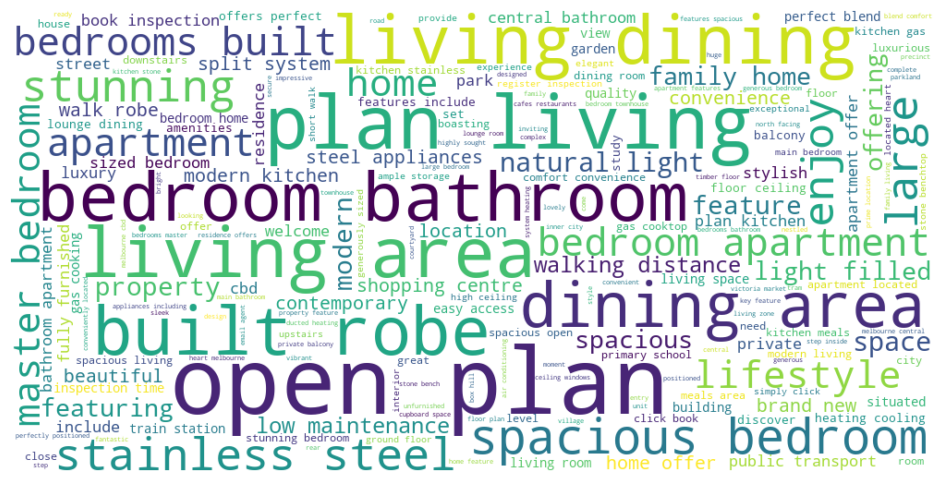

In [67]:
# Combine all the cleaned tokens from the 'expensive' properties into a single string
all_words = ' '.join([' '.join(tokens) for tokens in expensive['Cleaned_Tokens']])
wordcloud = WordCloud(
    width=1000, height=500, 
    background_color='white', 
    max_words=200, 
    max_font_size=100, 
).generate(all_words)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.show()

In [68]:
cheap = data_cleaned.loc[data_cleaned['Rent_Price'] <= Q3]
cheap.head(5)

,level_0,index,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,...,suburb_geometry,Distance_Bin,Duration_Bin,Distance_to_Nearest_Station_km,StationDist_Bin,Distance_Category,Feature_Count,Availability_full,Days_From_Now,Cleaned_Tokens
0,0,0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,...,POLYGON ((144.6523178479315 -37.83944528652476...,30-50 km,40-60 min,6.592960,6.592960,<20 km,0,"Friday, 18th October 2024",7,"[ray, white, tarneit, proudly, presents, isabe..."
1,1,1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,...,POLYGON ((144.9748830463324 -37.79793898811754...,0-5 km,0-20 min,1.915819,1.915819,<20 km,3,Available Now,0,"[rent, increase, week, starting, december, dis..."
2,2,2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,...,POLYGON ((144.7534775437447 -37.90070077370988...,20-30 km,20-40 min,4.499587,4.499587,<20 km,0,Available Now,0,"[vicprop, proud, present, spacious, family, ho..."
3,3,3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,...,POLYGON ((144.8831003432733 -37.78858527179909...,5-10 km,0-20 min,0.810762,0.810762,<20 km,0,Available Now,0,"[refurbished, bedroom, unit, bir, lockup, gara..."
4,4,4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,...,POLYGON ((144.9097019431684 -37.74685583335111...,5-10 km,0-20 min,0.631886,0.631886,<20 km,0,Available Now,0,"[week, free, rent, boutique, bedroom, apartmen..."


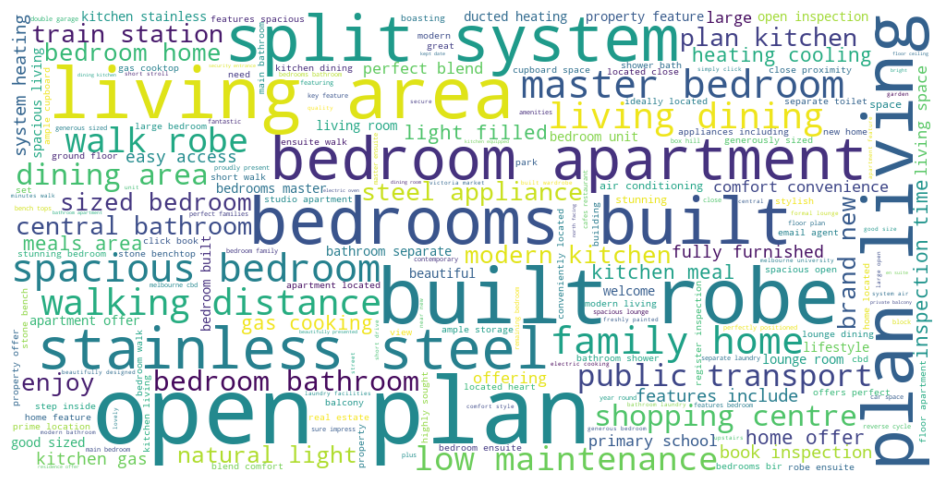

In [69]:
# Combine all the cleaned tokens from the 'cheap' properties into a single string
all_cheapwords = ' '.join([' '.join(tokens) for tokens in cheap['Cleaned_Tokens']])
wordcloud = WordCloud(
    width=1000, height=500, 
    background_color='white', 
    max_words=200, 
    max_font_size=100, 
).generate(all_cheapwords)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off') 
plt.show()

In [70]:
# Combine the cleaned tokens back into a single text string for each property
data_cleaned['Cleaned_Text'] = data_cleaned['Cleaned_Tokens'].apply(lambda x: ' '.join(x))
tfidf = TfidfVectorizer(max_features=500)

# Initialize the TfidfVectorizer with a limit of 500 features (words)
# TF-IDF (Term Frequency-Inverse Document Frequency) is a numerical statistic that reflects the importance of a word in a collection of documents
tfidf_matrix = tfidf.fit_transform(data_cleaned['Cleaned_Text'])
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())
print(tfidf_df.head())

   abundance    access  accommodation  added  additional  adjoining  agent  \
0        0.0  0.000000            0.0    0.0         0.0        0.0    0.0   
1        0.0  0.178029            0.0    0.0         0.0        0.0    0.0   
2        0.0  0.000000            0.0    0.0         0.0        0.0    0.0   
3        0.0  0.000000            0.0    0.0         0.0        0.0    0.0   
4        0.0  0.000000            0.0    0.0         0.0        0.0    0.0   

   air  airy  alfresco  ...  werribee  west  wide  windows  wir  wyndham  \
0  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   
1  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   
2  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   
3  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   
4  0.0   0.0       0.0  ...       0.0   0.0   0.0      0.0  0.0      0.0   

   yard  yarra  year  zone  
0   0.0    0.0   0.0   0.0  
1   0.0    0.0  

### **Property Description**
After processing the `Property Description`. We examine their impact on the Rent Price by building 2 features with 2 different models: TextBlob and BERT.

#### **Textblob Sentiment**
Textblob Sentiment Analysis is utilised to evaluate the emotional tone of property descriptions, categorizing them as positive, neutral, or negative. By analysing the sentiment behind the language used in these descriptions, we gain insights into how the wording might influence potential renters' perceptions of a property and its associated rental price. Even a modest positive tone can contribute to a more favorable renter response, highlighting how crucial well-crafted descriptions are in the rental market.

In [71]:
# Sentiment analysis using textblob for property description
def get_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity
data_cleaned['Sentiment'] = data_cleaned['Cleaned_Text'].apply(get_sentiment)

print(data_cleaned[['Property_Description', 'Sentiment']].head())

                                Property_Description  Sentiment
0  Ray White Tarneit proudly presents you 7 Isabe...    0.42500
1  *** Rent will increase to $480.00 Per Week sta...    0.16000
2  VICPROP is proud to present to you this spacio...    0.30000
3  A refurbished 2-bedroom unit all BIR's with lo...    0.14375
4  1ST WEEK FREE RENT...BOUTIQUE 2 BEDROOM APARTM...    0.50625


In [72]:
# Create a scatter plot to visualize the relationship between sentiment and rent price
fig = px.scatter(
    data_cleaned, 
    x='Sentiment', 
    y='Rent_Price', 
    title="Sentiment vs Rent Price",  
    labels={'Sentiment': 'Sentiment Score', 'Rent_Price': 'Rent Price (AUD)'},  
    size='Rent_Price',  
    hover_data=['Bedrooms', 'Bathrooms', 'Property_Type']  
)


fig.update_layout(
    title_x=0.5,  
    template='plotly_white',  
    height=600,  
)

fig.show()


In [73]:
correlation_sent = data_cleaned['Sentiment'].corr(data_cleaned['Rent_Price'])
print(correlation_sent)

0.1122173810495757


##### **Conclusion for Textblob Sentiment and Rental Price**
While a correlation value of 0.1122 may seem modest, it still indicates that sentiment analysis can provide valuable insights into rental pricing. Even though the relationship is weak, it reveals a slight tendency for more positive descriptions to be associated with higher rent. T

#### **BERT classification**
In this case, we are using the "textattack/bert-base-uncased-yelp-polarity" model, which has been fine-tuned to classify text as either positive or negative sentiment. Originally trained on Yelp reviews, this model is highly effective for sentiment tasks where emotional tone or customer satisfaction is evaluated. When applied to property descriptions, this BERT model can provide a more nuanced understanding of the emotional appeal of a property listing.

In [74]:
# Predicting using BERT whether the property description is negative or positive
tokenizer = AutoTokenizer.from_pretrained("textattack/bert-base-uncased-yelp-polarity")
model = BertForSequenceClassification.from_pretrained(
    "textattack/bert-base-uncased-yelp-polarity", problem_type="multi_label_classification"
)
# Extract property descriptions that have been preprocessed and tokenized
descriptions = data_cleaned['Cleaned_Text']

# Set the model to evaluation mode to disable dropout for inference
model.eval()

# Determine the number of output labels (positive/negative) from the model's configuration
num_labels = len(model.config.id2label)
model.config.num_labels = num_labels

# Initialize lists to store losses, predictions, and labels
losses = []
predicitons = []
labels_all = []

# Loop through each property description
for desc in descriptions:
    # Tokenize the description, convert it to tensors for BERT input, and apply truncation and padding
    inputs = tokenizer(desc, return_tensors="pt", truncation=True, padding=True)

    # Perform inference with the model (no_grad disables gradient computation, saving memory)
    with torch.no_grad():
        logits = model(**inputs).logits  # Compute the logits (raw scores before applying a softmax/sigmoid)
    
    # Convert the logits to binary class predictions (positive/negative) based on sigmoid activation
    predicted_class_ids = torch.arange(0, logits.shape[-1])[torch.sigmoid(logits).squeeze(dim=0) > 0.5]

    # Convert the predicted classes into one-hot encoded labels and sum them for a final prediction tensor
    labels = torch.sum(
        torch.nn.functional.one_hot(predicted_class_ids[None, :].clone(), num_classes=num_labels), dim=1
    ).to(torch.float)

    # Return the model back to training mode (optional, as you're only evaluating in this loop)
    model.train()

    # Compute the loss for each input to track model performance
    loss = model(**inputs, labels=labels).loss

    # Store the computed loss, predicted labels, and raw predictions
    losses.append(loss.item())
    labels_all.append(labels)
    predicitons.append(predicted_class_ids)

# Calculate the mean loss across all descriptions to assess the overall prediction quality
mean_loss = sum(losses) / len(losses)
print(f"Mean Loss: {mean_loss}")

# Store the predictions and labels
predicitons

# Check the type of the stored labels for further processing
type(labels_all)

# Flatten the predictions into a list for easy analysis and store them in a DataFrame
flattened_predictions = [tensor.flatten().tolist() for tensor in labels_all]

# Create a DataFrame to store the final predictions (negative_class, positive_class)
predictions_df = pd.DataFrame(flattened_predictions, columns=["negative_class", "positive_class"])

/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning:

`clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884

/Users/tinas/anaconda3/envs/group25env/lib/python3.11/site-packages/torch/_utils.py:776: UserWarning:

TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()



Mean Loss: 0.08134651684522183


### **Headline**
#### **Latent Dirichlet Allocation**

Latent Dirichlet Allocation (LDA) is used to categorize property headlines into distinct topics, offering insights into common themes and how these themes might correlate with rental prices. By applying LDA, we can identify the underlying structure in the text and group headlines into meaningful clusters, such as:

- Family Homes in Prime Locations
- Luxury Apartments with Modern Amenities
- Affordable, Spacious Living
- Renovated and Furnished Properties
- Convenient City Units

Each of these topics represents a general category that the headline conveys, allowing us to quantify and analyze the types of properties renters are drawn to based on their descriptions.


In [76]:
data_cleaned['Property_Headline'] = data_cleaned['Property_Headline'].astype(str)
data_cleaned['Cleaned_HLTokens'] = data_cleaned['Property_Headline'].apply(clean_and_tokenize_spacy)

Well-presented home with all the bells and whistles !!
Modern Living & Convenience in the Heart of Carlton! *Fully Furnished* with Smart Lights!
Close to everything!
Great Unit
Two bedroom apartment, unit, townhouse & warehouse
RENOVATED, SPACIOUS & SUNNY!!
FULLY FURNISHED STUDIO APARTMENT IN CBD, GREAT LOCATION WITH EVERYTHING YOU NEED
Charming Ground-Floor Apartment in Prime Location
Your Perfect Corner House in Moorabbin!
CLOSE TO UNI AND LYGON
Location Location Location
REFRESHED STUDIO!
PERFECT FOR FAMILY LIVING !!
A spacious 1 bedroom delight
AUSTRALIAN LUXURY THAT FEELS LIKE HOME  IN THE HEART OF RICHMOND! - FURNISHED
Your Perfect Family Retreat! **APPLY FOR THIS PROPERTY NOW**
Malvern Gem
SPACIOUS ONE BEDROOM IN SOUGHT AFTER ELM!
CLOSE DISTANCE TO ALL!!
BEAUTIFULLY PRESENTED TOWNHOUSE
Brand New and high end quality apartment
BRAND NEW HOUSE, FRESH START
Welcome to a Family Inspired Neighborhood
Family Home
LOVELY FAMILY HOME
Stylish and Spacious Family Home in Lara
LARGE 2 BEDR

In [77]:
# Predicting using gensim the main category for headline

dictionary = corpora.Dictionary(data_cleaned['Cleaned_HLTokens'])
corpus = [dictionary.doc2bow(text) for text in data_cleaned['Cleaned_HLTokens']]

lda_model = LdaModel(corpus, num_topics=5, id2word=dictionary, passes=10)

topics = lda_model.print_topics(num_words=5)
for topic in topics:
    print(topic)

(0, '0.108*"living" + 0.036*"student" + 0.035*"accommodation" + 0.032*"luxury" + 0.027*"city"')
(1, '0.033*"lease" + 0.022*"bed" + 0.021*"located" + 0.021*"available" + 0.019*"ideal"')
(2, '0.188*"home" + 0.116*"family" + 0.070*"bedroom" + 0.063*"new" + 0.046*"brand"')
(3, '0.160*"location" + 0.055*"bedroom" + 0.048*"unit" + 0.045*"prime" + 0.042*"great"')
(4, '0.141*"apartment" + 0.098*"bedroom" + 0.061*"furnished" + 0.042*"fully" + 0.028*"heart"')


In [78]:
# Define a dictionary mapping topic numbers (generated by LDA) to descriptive labels
topic_labels = {
    0: "Family Homes in Prime Locations",
    1: "Beautiful, Convenient Family Homes",
    2: "Modern, Low-Maintenance Apartments",
    3: "Stunning Furnished Apartments/Townhouses",
    4: "Central Units for Lease"
}

data_cleaned['Dominant_Topic'] = [max(lda_model[corpus[i]], key=lambda x: x[1])[0] for i in range(len(corpus))]

# Map the numeric dominant topic to the descriptive label using the topic_labels dictionary
data_cleaned['Dominant_Topic_Label'] = data_cleaned['Dominant_Topic'].map(topic_labels)

print(data_cleaned[['Property_Headline', 'Dominant_Topic_Label']].head())


                                   Property_Headline  \
0  Well-presented home with all the bells and whi...   
1  Modern Living & Convenience in the Heart of Ca...   
2                               Close to everything!   
3                                         Great Unit   
4  Two bedroom apartment, unit, townhouse & wareh...   

                       Dominant_Topic_Label  
0        Modern, Low-Maintenance Apartments  
1                   Central Units for Lease  
2           Family Homes in Prime Locations  
3  Stunning Furnished Apartments/Townhouses  
4  Stunning Furnished Apartments/Townhouses  


In [79]:
topic_distribution = data_cleaned['Dominant_Topic_Label'].value_counts().reset_index()
topic_distribution.columns = ['Topic', 'Count']
fig = px.bar(topic_distribution, x='Topic', y='Count', title="Topic Distribution")
fig.show()

In [80]:
anova_result = stats.f_oneway(*[group['Rent_Price'].values for name, group in data_cleaned.groupby('Dominant_Topic_Label')])
print(f'ANOVA F-statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}')

ANOVA F-statistic: 15.462912142209767, p-value: 1.272862326064688e-12


#### **Conclusion for Gensim LDA labels and Rent Price**
The ANOVA test, with an F-statistic of 15.46 and a p-value of 1.27e-12, indicates that there is a statistically significant difference in rent prices across properties grouped by their dominant topic label.

### **Merging and Forming the Input Dataset**

In [81]:
predictions_df = predictions_df.reset_index(drop=True)
data_cleaned = data_cleaned.reset_index(drop=True)
data_cleaned = data_cleaned.drop("index",axis = 1 )
data_cleaned = pd.concat([data_cleaned, temp_top_10], axis = 1)
data_cleaned

,level_0,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,...,Built in wardrobes,Dishwasher,Air conditioning,Floorboards,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced
0,0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,...,0,0,0,0,0,0,0,0,0,0
1,1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,...,0,1,0,0,0,0,0,0,0,0
2,2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,...,0,0,0,0,0,0,0,0,0,0
3,3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,...,0,0,0,0,0,0,0,0,0,0
4,4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,12297,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0,0,0,House,-36.543437,145.984015,...,0,0,0,0,0,0,0,0,0,0
12298,12298,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4,2,2,House,-37.759074,144.696542,...,0,0,0,0,0,0,0,0,0,0
12299,12299,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4,2,2,House,-37.676119,144.900169,...,0,0,0,0,0,0,0,0,0,0
12300,12300,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2,1,0,Apartment / Unit / Flat,-37.913004,145.124261,...,0,0,0,0,0,0,0,0,0,0


In [83]:
final_pipe_columns = ['URL', 'Rent_Price', 'Address', 'Bedrooms', 'Bathrooms', 'Parking',
       'Property_Type', 'Latitude', 'Longitude', 'Date_Available', 'Bond',
       'Internal_Area', 'Land_Area', 'Street', 'Suburb', 'Postcode',
       'Street_Name', 'Property_Size', 'geometry', 'Distances to CBD',
       'Durations to CBD', 'SA2_CODE21', 'SA2_NAME21', 'AREASQKM21',
       'LOCI_URI21', 'suburb_geometry', 'Distance_to_Nearest_Station_km', 'Feature_Count', 'Cleaned_Text', 
       'Sentiment', 'Dominant_Topic_Label', 'Built in wardrobes',
       'Dishwasher', 'Air conditioning', 'Floorboards', 'Secure Parking',
       'Intercom', 'Heating', 'Ensuite', 'Balcony / Deck', 'Fully fenced', 'Days_From_Now'
       ]

input_data = pd.concat([data_cleaned[final_pipe_columns], predictions_df], axis=1)
input_data = input_data.dropna(how='all')
missing_coords = input_data[input_data['Latitude'].isna() | input_data['Longitude'].isna()]
print(f"Rows with missing coordinates: {len(missing_coords)}")
input_data = input_data.dropna(subset=['Latitude', 'Longitude'])

input_data

Rows with missing coordinates: 0


,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Date_Available,...,Floorboards,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced,Days_From_Now,negative_class,positive_class
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,Later,...,0,0,0,0,0,0,0,7,0.0,1.0
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,Available Now,...,0,0,0,0,0,0,0,0,0.0,1.0
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,Available Now,...,0,0,0,0,0,0,0,0,0.0,1.0
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,Available Now,...,0,0,0,0,0,0,0,0,0.0,1.0
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,Available Now,...,0,0,0,0,0,0,0,0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0,0,0,House,-36.543437,145.984015,Available Now,...,0,0,0,0,0,0,0,0,1.0,0.0
12298,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4,2,2,House,-37.759074,144.696542,Available Now,...,0,0,0,0,0,0,0,0,0.0,1.0
12299,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4,2,2,House,-37.676119,144.900169,Available Now,...,0,0,0,0,0,0,0,0,0.0,1.0
12300,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2,1,0,Apartment / Unit / Flat,-37.913004,145.124261,Later,...,0,0,0,0,0,0,0,0,0.0,1.0


In [84]:
# Column to create 2km radius polygon
input_data = gpd.GeoDataFrame(input_data, 
                                geometry=gpd.points_from_xy(input_data['Longitude'], input_data['Latitude']), 
                                crs="EPSG:4326")

input_data = input_data.to_crs(epsg=3857)

input_data['geometr_2km'] = input_data['geometry'].buffer(2000)
input_data = input_data.to_crs(epsg=3857)
input_data = input_data.set_geometry('geometr_2km')

input_data


,URL,Rent_Price,Address,Bedrooms,Bathrooms,Parking,Property_Type,Latitude,Longitude,Date_Available,...,Secure Parking,Intercom,Heating,Ensuite,Balcony / Deck,Fully fenced,Days_From_Now,negative_class,positive_class,geometr_2km
0,https://www.domain.com.au/7-isabella-way-tarne...,500.0,"7 Isabella Way, Tarneit VIC 3029",4,2,2,House,-37.837929,144.653245,Later,...,0,0,0,0,0,0,7,0.0,1.0,"POLYGON ((16104725.597 -4556555.820, 16104715...."
1,https://www.domain.com.au/1906-570-lygon-stree...,460.0,"1906/570 Lygon Street, Carlton VIC 3053",1,1,0,Apartment / Unit / Flat,-37.793559,144.969056,Available Now,...,0,0,0,0,0,0,0,0.0,1.0,"POLYGON ((16139881.539 -4550303.588, 16139871...."
2,https://www.domain.com.au/5-modra-street-point...,550.0,"5 Modra Street, Point Cook VIC 3030",4,2,2,House,-37.905707,144.773112,Available Now,...,0,0,0,0,0,0,0,0.0,1.0,"POLYGON ((16118069.097 -4566113.911, 16118059...."
3,https://www.domain.com.au/5-63-droop-street-fo...,560.0,"5/63 Droop street, Footscray VIC 3011",2,1,1,Apartment / Unit / Flat,-37.796075,144.895730,Available Now,...,0,0,0,0,0,0,0,0.0,1.0,"POLYGON ((16131718.926 -4550657.968, 16131709...."
4,https://www.domain.com.au/104-193-buckley-stre...,530.0,"104/193 Buckley Street, Essendon VIC 3040",2,1,1,Apartment / Unit / Flat,-37.756341,144.909078,Available Now,...,0,0,0,0,0,0,0,0.0,1.0,"POLYGON ((16133204.819 -4545061.963, 16133195...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,https://www.domain.com.au/21-hannah-street-ben...,155.0,"21 Hannah Street, Benalla VIC 3672",0,0,0,House,-36.543437,145.984015,Available Now,...,0,0,0,0,0,0,0,1.0,0.0,"POLYGON ((16252866.247 -4375657.444, 16252856...."
12298,https://www.domain.com.au/34-yosemite-street-t...,530.0,"34 Yosemite Street, Truganina VIC 3029",4,2,2,House,-37.759074,144.696542,Available Now,...,0,0,0,0,0,0,0,0.0,1.0,"POLYGON ((16109545.375 -4545446.804, 16109535...."
12299,https://www.domain.com.au/39-kenny-street-west...,550.0,"39 Kenny Street, Westmeadows VIC 3049",4,2,2,House,-37.676119,144.900169,Available Now,...,0,0,0,0,0,0,0,0.0,1.0,"POLYGON ((16132213.040 -4533772.743, 16132203...."
12300,https://www.domain.com.au/311-1728-dandenong-r...,550.0,"311/1728 Dandenong Road, Clayton VIC 3168",2,1,0,Apartment / Unit / Flat,-37.913004,145.124261,Later,...,0,0,0,0,0,0,0,0.0,1.0,"POLYGON ((16157158.836 -4567143.517, 16157149...."


In [85]:
input_data.to_csv("../data/curated/input_df.csv", index=False)